In [13]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt


Data = pd.read_csv('spotify_audio_features.csv')


Data = Data.dropna()

In [14]:
#Subset numerical data
index_cols = ["artist", "title", "spotify_id", "volume_number", "number"]
cat_cols = ["mode", "key"]
num_cols = ["speechiness", "duration", "time_signature", "acousticness", "danceability",
            "energy", "instrumentalness", "liveness", "loudness", "valence", "tempo"]

Num_Data = Data[num_cols]

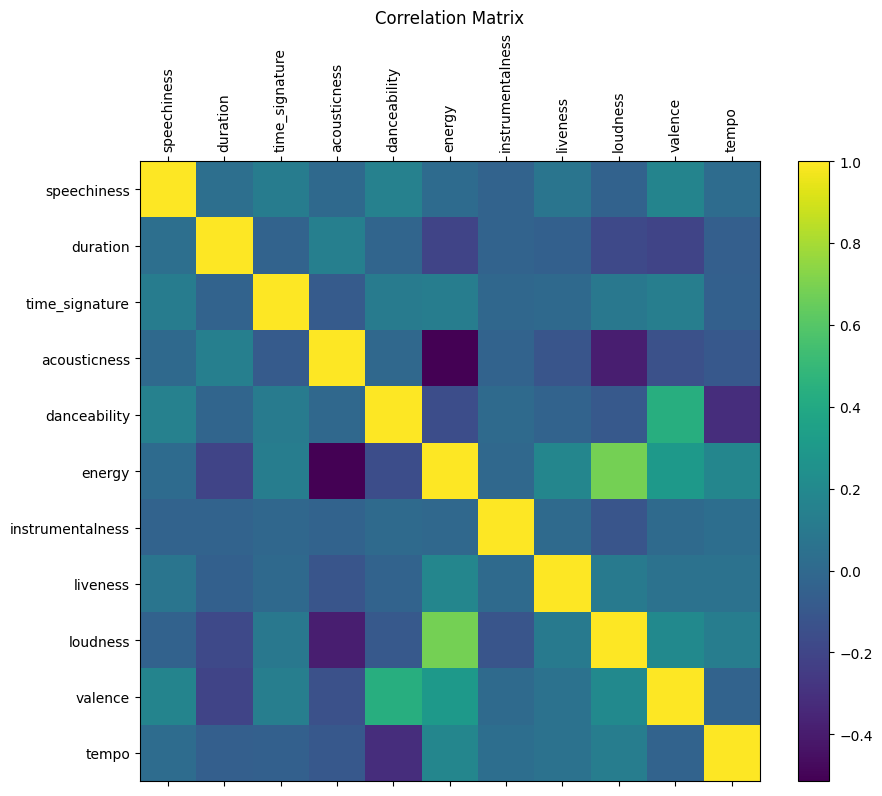

In [15]:
M = Num_Data.corr()
plt.figure(figsize=(10, 8))
plt.matshow(M, cmap='viridis', fignum=1)
plt.title('Correlation Matrix')
plt.xticks(range(len(M.columns)), M.columns, rotation=90)
plt.yticks(range(len(M.columns)), M.columns)
plt.colorbar()
plt.show()

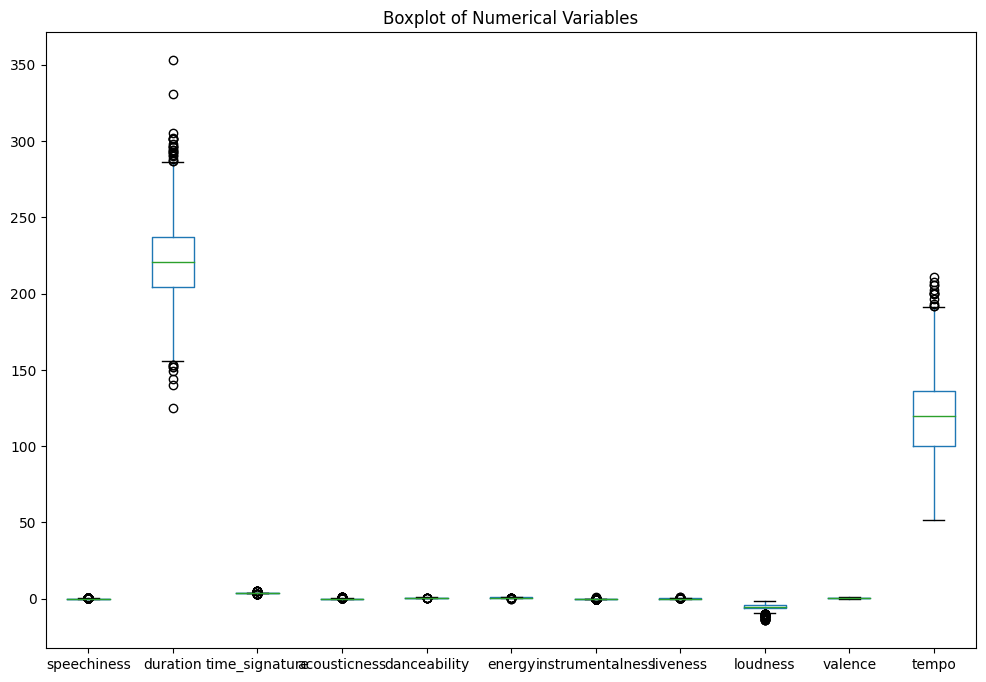

In [18]:
Num_Data.boxplot(figsize=(12, 8),grid=False)
plt.title('Boxplot of Numerical Variables')
plt.show()

In [19]:
scaler = StandardScaler()
Num_Data_Norm = scaler.fit_transform(Num_Data)

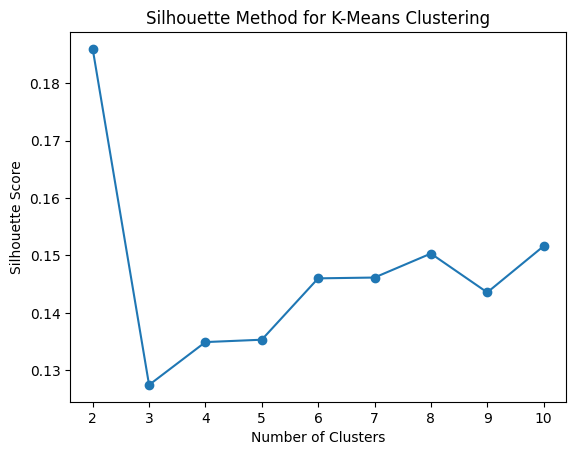

In [21]:
import warnings

warnings.filterwarnings("ignore")

max_clusters = 10
silhouette_scores = []

for i in range(2, max_clusters + 1):
    kmeans = KMeans(n_clusters=i, random_state=42)
    clusters = kmeans.fit_predict(Num_Data_Norm)
    silhouette_scores.append(silhouette_score(Num_Data_Norm, clusters))

# Plot silhouette scores
plt.plot(range(2, max_clusters + 1), silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Method for K-Means Clustering')
plt.show()

In [22]:
optimal_clusters = np.argmax(silhouette_scores) + 2
print(f'Optimal Number of Clusters: {optimal_clusters}')

Optimal Number of Clusters: 2


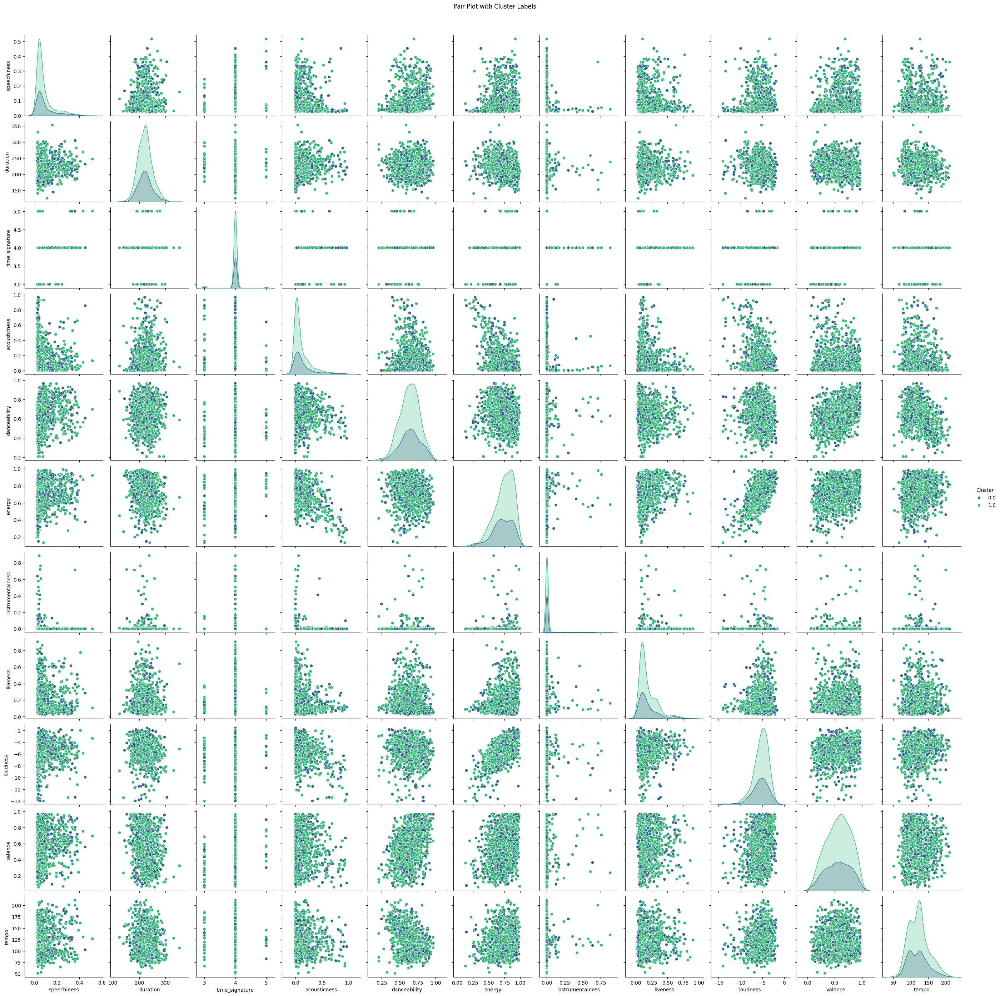

In [25]:
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import pandas as pd



# Fit KMeans to the normalized data
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
final_clusters = kmeans.fit_predict(Num_Data_Norm)

# Create a DataFrame with the original data and the cluster labels
df_with_clusters = pd.concat([Num_Data, pd.Series(final_clusters, name='Cluster')], axis=1)

# Create a pair plot
sns.pairplot(df_with_clusters, hue='Cluster', palette='viridis')
plt.suptitle('Pair Plot with Cluster Labels', y=1.02)
plt.show()


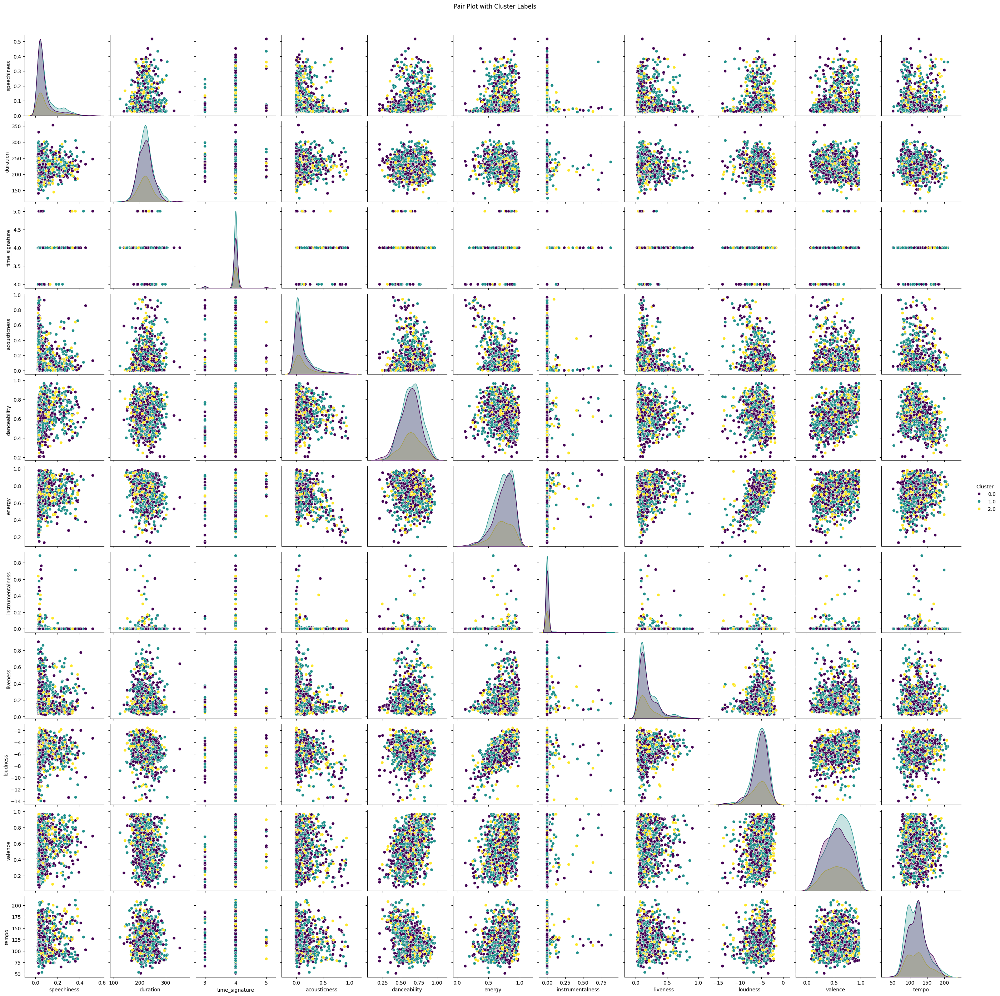

In [26]:
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import pandas as pd



# Fit KMeans to the normalized data
kmeans = KMeans(n_clusters=3, random_state=42)
final_clusters = kmeans.fit_predict(Num_Data_Norm)

# Create a DataFrame with the original data and the cluster labels
df_with_clusters = pd.concat([Num_Data, pd.Series(final_clusters, name='Cluster')], axis=1)

# Create a pair plot
sns.pairplot(df_with_clusters, hue='Cluster', palette='viridis')
plt.suptitle('Pair Plot with Cluster Labels', y=1.02)
plt.show()

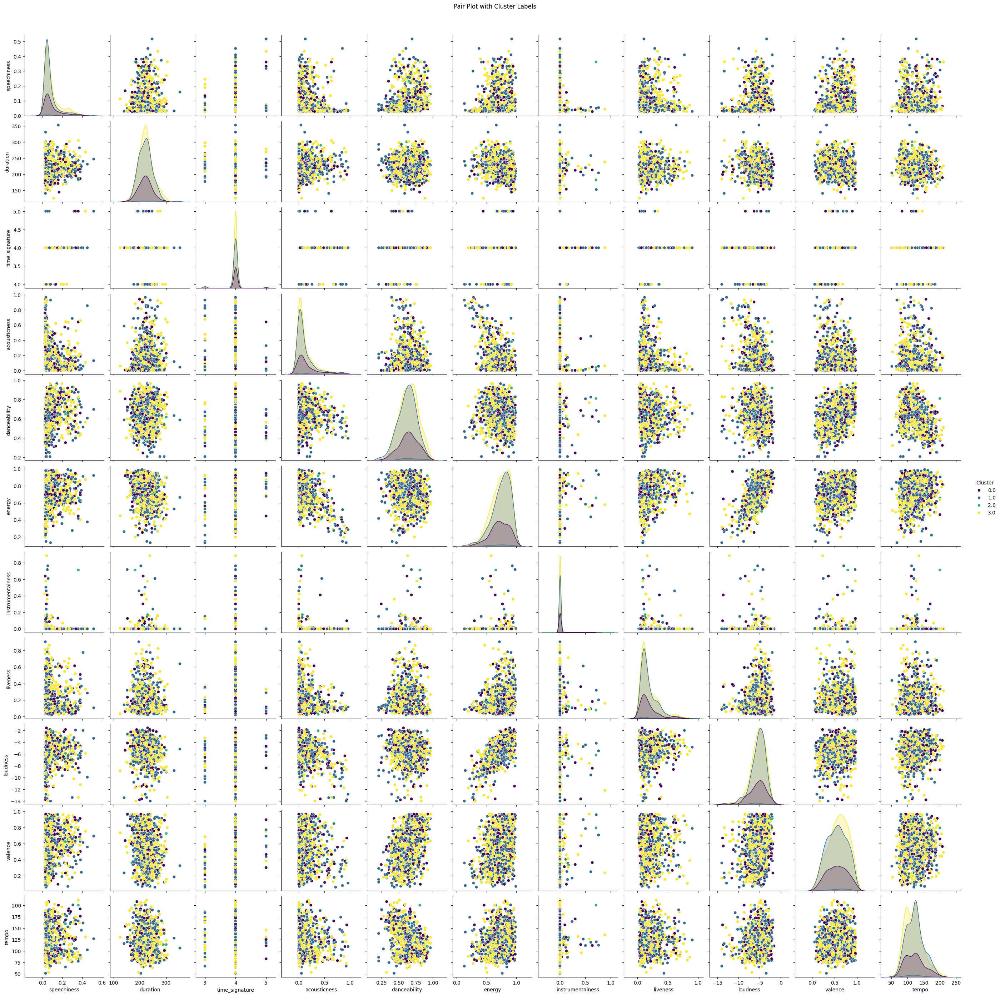

In [27]:
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import pandas as pd



# Fit KMeans to the normalized data
kmeans = KMeans(n_clusters=4, random_state=42)
final_clusters = kmeans.fit_predict(Num_Data_Norm)

# Create a DataFrame with the original data and the cluster labels
df_with_clusters = pd.concat([Num_Data, pd.Series(final_clusters, name='Cluster')], axis=1)

# Create a pair plot
sns.pairplot(df_with_clusters, hue='Cluster', palette='viridis')
plt.suptitle('Pair Plot with Cluster Labels', y=1.02)
plt.show()